<a href="https://colab.research.google.com/github/JuanCobas/AnalisisDeDatosTP1/blob/main/DataSet_Venta_Inmuebles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#ANALISIS DE DATOS SOBRE DATASET VENTA DE PROPIEDADES INMUEBLES EN CONNECTICUT

## 1 - ETL (Extraccion, Transformacion, Carga)

###Extraccion

In [ ]:
from os import replace
import pandas as pd
import chardet

from google.colab import drive
#Montamos google drive para acceder al archivo
drive.mount('/content/drive', force_remount=True)
#path
file_path = '/content/drive/MyDrive/DataSets/Real_Estate_Sales_2001-2023_GL.csv'

with open(file_path, 'rb') as f:
  result = chardet.detect(f.read())
  print(result['encoding'])
  print(f.read())

try:
  df = pd.read_csv(file_path, sep=',', decimal=',', encoding=result['encoding'], low_memory=False) #low memory False es para que pandas cargue todos los datos antes de intentar inferir los tipos.
  print('Extraccion de datos exitosa')
except FileNotFoundError:
  print(f'El archivo no se encuentra en la ruta {file_path}')

Mounted at /content/drive
utf-8
b''
Extraccion de datos exitosa


In [ ]:
#Seteamos para que pandas siempre muestre los datos sin notacion cientifica y con dos decimales
pd.set_option('display.float_format', '{:.2f}'.format)

###Transformacion

In [ ]:
#Todas las columnas menos las 2 primeras son tipo object
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1141722 entries, 0 to 1141721
Data columns (total 14 columns):
 #   Column            Non-Null Count    Dtype 
---  ------            --------------    ----- 
 0   Serial Number     1141722 non-null  int64 
 1   List Year         1141722 non-null  int64 
 2   Date Recorded     1141720 non-null  object
 3   Town              1141722 non-null  object
 4   Address           1141671 non-null  object
 5   Assessed Value    1141722 non-null  object
 6   Sale Amount       1141722 non-null  object
 7   Sales Ratio       1141722 non-null  object
 8   Property Type     759276 non-null   object
 9   Residential Type  738804 non-null   object
 10  Non Use Code      324807 non-null   object
 11  Assessor Remarks  181090 non-null   object
 12  OPM remarks       14346 non-null    object
 13  Location          341241 non-null   object
dtypes: int64(2), object(12)
memory usage: 121.9+ MB


In [ ]:
#Si tratamos de convertir Date Recorded a dateTime nos indica un error de formato ya que algunas fechas en dicha columna tienen el año empezando con 0, ejemplo 0024, por lo que debemos convertir esos datos

df['Date Recorded'] = df['Date Recorded'].astype(str).str.strip()

df['Date Recorded'] = df['Date Recorded'].str.replace(
    r'(\d{2}/\d{2}/)00(\d{2})',
    r'\g<1>20\2',
    regex=True
)

In [ ]:
#Ahora si podes convetir a dateTime normalmente
df['Date Recorded'] = pd.to_datetime(df['Date Recorded'])

In [ ]:
#Transformamos la columna Town a string
df['Town'] = df['Town'].astype('string')

#Transformamos la columna Address a string
df['Address'] = df['Address'].astype('string')

#Transformamos las columans Assessed Value, Sale Amount y Sales Ratio a flotante

df['Assessed Value'] = df['Assessed Value'].astype(float)
df['Sale Amount'] = df['Sale Amount'].astype(float)
#Algunos Sales Ratio tienen valores muy grandes, en los miles, y poseen "," por lo que pandas da error en su conversion, debemos eliminar las comas primero y luego convertir. IGUALMETE este tipo de ratio indica ventas
#figuradas, donde se esta realizando o una venta parcial, o algun tipo de transferencia de activos. Dichas filas deberian ser eliminadas
df['Sales Ratio'] = (
    df['Sales Ratio']
    .astype(str)          # make sure it’s string
    .str.replace(',', '', regex=False)  # remove commas
    .astype(float)        # then convert to float
)







In [ ]:
#Convertimos el resto de columnas a string
df['Property Type'] = df['Property Type'].astype('string')
df['Residential Type'] = df['Residential Type'].astype('string')
df['Non Use Code'] = df['Non Use Code'].astype('string')
df['Assessor Remarks'] = df['Assessor Remarks'].astype('string')
df['OPM remarks'] = df['OPM remarks'].astype('string')

In [ ]:
#Para nuestro analisis vamos a presindir de las ultimas 3 columnas (Assessor Remarks, OPM remarks y Location)
df = df.drop(columns=['Assessor Remarks', 'OPM remarks', 'Location'])

In [ ]:
#Segun la propia documentacion del dataset, todas las filas que posean un valor en Non Use Code indican que la transaccion no es usable como venta
#y que su valor no deberia ser usado como referencia del precio real de la propiedad
df = df[df['Non Use Code'].isna()]

In [ ]:
#Ahora podemos remover completamente la columna Non Use Code
df = df.drop(columns=['Non Use Code'])

In [ ]:
#Usando la funcion describe vemos que todavia hay Sales Ratio muy altos que distorcionan el data set. Vamos a remover cualquier ratio mayor a 1.5
df = df[df['Sales Ratio'] < 1.5]

In [ ]:
#Vemos que ratios altos indican al tipo de Non Use Code, lo que reprensetan in tipo de venta especial y dicho valor de venta no deberia ser tenido en cuenta para hacer un valoracion del precio de una propiedad
df[df['Sales Ratio'] > 1]

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type
27,200387,2020,2021-01-06,Bristol,WILDEWOOD RUN LOT 50,47530.00,44900.00,1.06,Vacant Land,<NA>
222,210140,2021,2022-01-04,Simsbury,88 HOPMEADOW STREET,474360.00,465000.00,1.02,Commercial,<NA>
242,200015,2020,2020-10-16,Portland,9 CULVER LN,56420.00,56400.00,1.00,Vacant Land,<NA>
365,21072,2021,2022-06-14,Goshen,LOT 6 TYLER RIDGE DR,117650.00,110000.00,1.07,Vacant Land,<NA>
374,210017,2021,2021-11-17,East Granby,16 HATCHET HILL ROAD,60700.00,60000.00,1.01,Vacant Land,<NA>
590,210598,2021,2022-04-04,Hamden,3190 WHITNEY AVE U6,255500.00,245000.00,1.04,Commercial,<NA>
609,210621,2021,2022-04-11,Hamden,351 KNOB HILL DR,209090.00,200000.00,1.05,Residential,Single Family
808,21565,2021,2022-08-23,Guilford,7 VIEW PL,162700.00,155000.00,1.05,Residential,Single Family
1028,210120,2021,2021-10-29,Bristol,33 LAKESIDE DR UN 39,72520.00,69000.00,1.05,Residential,Condo
1282,210929,2021,2022-02-08,Bridgeport,1473 CHOPSEY HILL RD,87532.00,60000.00,1.46,Vacant Land,<NA>


In [ ]:
df.tail()

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type
1141715,230068,2023,2024-03-18,Woodstock,75 LAUREL DR,248800.00,460000.00,0.54,Residential,Single Family
1141716,230088,2023,2024-05-13,Woodstock,83 OAK DR,147100.00,268000.00,0.55,Residential,Single Family
1141718,230568,2023,2024-05-15,West Haven,165 MILTON AVE,148050.00,400300.00,0.37,Residential,Single Family
1141719,230217,2023,2024-02-20,Southington,242 LAZY LN,177340.00,334750.00,0.53,Residential,Single Family
1141720,230097,2023,2024-05-30,Old Lyme,21 BUTTONBALL RD,8030.00,35000.00,0.23,Vacant Land,<NA>


In [ ]:
#mostramos info rapida del datasaet
df.describe()

,Serial Number,List Year,Date Recorded,Assessed Value,Sale Amount,Sales Ratio
count,815524.00,815524.00,815522,815524.00,815524.00,815524.00
mean,602215.36,2011.55,2012-10-27 13:26:59.139643648,240815.41,415971.39,0.59
min,0.00,2001.00,1999-04-05 00:00:00,0.00,0.00,0.00
25%,30716.00,2004.00,2005-09-21 00:00:00,95620.00,172500.00,0.47
50%,80389.00,2012.00,2012-12-12 00:00:00,148280.00,259900.00,0.58
75%,180424.00,2018.00,2019-09-26 00:00:00,237440.00,401700.00,0.69
max,2000500023.00,2023.00,2024-10-02 00:00:00,105438300.00,163000000.00,1.50
std,8035193.14,7.19,NaN,679303.65,1239074.71,0.17


###Carga

In [ ]:
#definir la ruta de salida para el nuevo CSV

output_path = '/content/drive/MyDrive/DataSets/Real_Estate_Sales_2001-2023_GL_transformado.csv'

#guardar el dataframe transformado en un nuevo archivo CSV

df.to_csv(output_path, index=False, sep = ',')

print(f'Datos transformados guardados en {output_path}')

Datos transformados guardados en /content/drive/MyDrive/DataSets/Real_Estate_Sales_2001-2023_GL_transformado.csv


##2 - EDA (Análisis Exploratorio de datos)

###Agrupamos por List Year y obtenemos el promedio de las columnas Sale Amount, Assessed Value y Sales Ratio, ademas de agregar la columna Count con un conteo de la cantidad de transacciones en ese grupo.

In [ ]:
year_table = df.groupby('List Year')[['Sale Amount', 'Assessed Value', 'Sales Ratio']].mean()
year_table['Count'] = df.groupby('List Year').size()
year_table

,Sale Amount,Assessed Value,Sales Ratio,Count
List Year,,,,
2001,252122.27,126282.15,0.53,45176
2002,311478.03,153596.69,0.50,46238
2003,331314.57,159286.54,0.49,49388
2004,387080.64,179191.29,0.46,65299
2005,364721.55,166286.37,0.45,48314
2006,472631.74,260165.34,0.54,36693
2007,453972.59,273960.59,0.62,24314
2008,355006.23,258252.59,0.73,21107
2009,411773.23,307616.95,0.76,27232


####Se aprecia que el precio de venta es muycho mas alto que el precio de valuacion fiscal. En el año 2008, en el que explota la burbuja de hipotecas subprime, se puede ver una caida en el precio de la vivienda por primera vez en años. Tambien se ve un aumento en el ratio promedio, con valuaciones fiscales mas acordes al precio de mercado

###Agrupamos por Town y obtenemos el promedio de las columnas Sale Amount, Assessed Value y Sales Ratio, ademas de agregar la columna Count con un conteo de la cantidad de transacciones en ese grupo.

In [ ]:
town_table = df.groupby('Town')[['Sale Amount', 'Assessed Value', 'Sales Ratio']].mean().sort_values(by='Sale Amount', ascending= False)
town_table['Count'] = df.groupby('Town').size()
town_table
#Asi podemos ver los pueblos mas caros y mas baratos del estado. Vemos que a pesar de la diferencia de precio, los ratios son en general constantes

,Sale Amount,Assessed Value,Sales Ratio,Count
Town,,,,
Greenwich,2136618.11,1307823.15,0.62,14598
New Canaan,1605543.42,1021554.21,0.65,5934
Darien,1593229.63,961328.64,0.61,6432
Westport,1511248.84,886924.89,0.60,7963
Weston,992270.37,611554.56,0.64,3103
...,...,...,...,...
Waterbury,200209.45,100007.32,0.53,20053
Plymouth,198055.06,118169.34,0.62,2931
Torrington,192563.51,104582.24,0.57,9796


###Agrupamos por Town y obtenemos el promedio de las columnas Sale Amount, Assessed Value y Sales Ratio, ademas de agregar la columna Count con un conteo de la cantidad de transacciones en ese grupo. En este caso ordenamos por la columna Count

In [ ]:
town_table = df.groupby('Town')[['Sale Amount', 'Assessed Value', 'Sales Ratio']].mean()
town_table['Count'] = df.groupby('Town').size()
town_table.sort_values(by='Count', ascending= False)

,Sale Amount,Assessed Value,Sales Ratio,Count
Town,,,,
Stamford,670924.62,370119.74,0.55,31134
Bridgeport,255320.47,131737.69,0.55,23585
Norwalk,623994.33,355089.10,0.58,23553
Waterbury,200209.45,100007.32,0.53,20053
West Hartford,374321.13,207233.05,0.56,19068
New Haven,353533.39,178975.62,0.55,17947
Danbury,391643.79,220343.77,0.59,17422
Hamden,260660.04,147812.64,0.60,14742
Greenwich,2136618.11,1307823.15,0.62,14598


###Agrupamos por Property Type y obtenemos el promedio de las columnas Sale Amount, Assessed Value y Sales Ratio, ademas de agregar la columna Count con un conteo de la cantidad de transacciones en ese grupo.

In [ ]:
property_type_table = df.groupby('Property Type')[['Sale Amount', 'Assessed Value', 'Sales Ratio']].mean().sort_values(by='Sale Amount', ascending= False)
property_type_table['Count'] = df.groupby('Property Type').size()
property_type_table

,Sale Amount,Assessed Value,Sales Ratio,Count
Property Type,,,,
Apartments,2998328.09,1378742.04,0.47,1076
Industrial,2007330.32,943024.17,0.56,672
Commercial,1681982.20,888316.53,0.61,4386
Residential,470361.84,247391.16,0.52,150816
Single Family,435020.48,293959.76,0.69,279630
Four Family,304458.09,184151.59,0.65,1080
Two Family,257267.07,161508.76,0.65,13436
Three Family,251328.24,143764.67,0.59,5784
Condo,234597.12,158098.85,0.68,76881


###Vemos cuantos tipos de propiedad son nan en todos los años

In [ ]:
tipo_propiedad_faltantes = df[df['Property Type'].isna()].groupby('List Year').size()
print(tipo_propiedad_faltantes)

List Year
2001    45176
2002    46238
2003    49388
2004    65299
2005    48314
2006     2544
2007     1721
2008     1149
2009     1390
2010     1351
2011     1237
2012     1375
2013     1585
2014     1694
2015     1620
2016     1625
2017     1744
2018     1888
2019     2181
dtype: int64


##3 - PREGUNTAS DE NEGOCIO

###Que pueblos o ciudades tienen las mejores chances de ser una buena inversion en base al crecimiento del precio año a año.

In [ ]:
#Obtenemos el precio medio por ciudad y por año (para cada pueblo tenemos el precio medio de todos los años). Utilizadmos la media para que viviendas de alto valor no distorcionen la tasa de crecimiento
precio_promedio_pueblo_anio = df.groupby(['Town', 'List Year'])['Sale Amount'].median().reset_index()
#Creamos una columna donde mostramos el precio promedio del año anterior. Luego creamos otra columna con el ratio de crecimeinto, haciendo la diferencia entre el precio promedio actual y el del año anterior,
#para luego dividir por el precio promedio de año anterior
precio_promedio_pueblo_anio['Precio Anio Anterior'] = precio_promedio_pueblo_anio.groupby('Town')['Sale Amount'].shift(1)
precio_promedio_pueblo_anio['Tasa Crecimiento'] = (precio_promedio_pueblo_anio['Sale Amount'] - precio_promedio_pueblo_anio['Precio Anio Anterior']) / precio_promedio_pueblo_anio['Precio Anio Anterior']

#removemos el nan del primer año
precio_promedio_pueblo_anio = precio_promedio_pueblo_anio.dropna(subset=['Tasa Crecimiento'])

#Agrupamos por pueblo y obtenemos la tasa de crecimiento promedio
crecimiento_pueblo = precio_promedio_pueblo_anio.groupby('Town')['Tasa Crecimiento'].mean().sort_values(ascending=False)

#Contamos la cantidad total de transacciones por pueblo en todo el dataset
conteo_transacciones = (
    df.groupby('Town').size()
    .rename('Cantidad Transacciones')
)

#Unimos ambas tablas
crecimiento_pueblo = (
    crecimiento_pueblo
    .to_frame()
    .join(conteo_transacciones)
    .sort_values(by='Tasa Crecimiento', ascending=False)
)
print(crecimiento_pueblo)

                  Tasa Crecimiento  Cantidad Transacciones
Town                                                      
Greenwich                     0.17                   14598
Washington                    0.16                    1127
Canaan                        0.14                     323
Eastford                      0.12                     391
Roxbury                       0.12                     565
Willington                    0.09                    1064
Bridgewater                   0.09                     419
Norfolk                       0.08                     433
Union                         0.08                     141
Lyme                          0.08                     558
Sherman                       0.08                     804
Goshen                        0.08                    1184
Bozrah                        0.08                     457
Sharon                        0.07                     899
Pomfret                       0.07                     7

####Vemos que Greenwich, Washington y Canaan fueron los mejores pueblos para invertir en los ultimos 20 años, ya que presentan la tasa promedio de crecimiento mas alta

###Que impacto tuvo la crisis de la hipoteca subprime del 2008 en el precio y volumen de las transacciones de viviendas.

In [ ]:
# Contamos la cantidad de transacciones por año
conteo_por_anio = (
    df.groupby('List Year')
    .size()
    .rename('Cantidad Transacciones')
    .reset_index()
)

#Calculamos el precio de venta mediano por año
precio_medio_por_anio = (
    df.groupby('List Year')['Sale Amount']
    .median()
    .rename('Precio Venta')
    .reset_index()
)

#Unimos ambas tablas
actividad_por_anio = pd.merge(conteo_por_anio, precio_medio_por_anio, on='List Year')

#Ordenamos cronológicamente
actividad_por_anio = actividad_por_anio.sort_values('List Year')

print(actividad_por_anio)

    List Year  Cantidad Transacciones  Precio Mediano Venta
0        2001                   45176             175000.00
1        2002                   46238             195000.00
2        2003                   49388             214000.00
3        2004                   65299             243000.00
4        2005                   48314             250000.00
5        2006                   36693             274000.00
6        2007                   24314             265000.00
7        2008                   21107             240000.00
8        2009                   27232             251837.50
9        2010                   20476             250000.00
10       2011                   19237             262000.00
11       2012                   23111             260000.00
12       2013                   25389             250000.00
13       2014                   31905             260000.00
14       2015                   30473             247000.00
15       2016                   32776   

####Vemos que hasta el año 2006 el precio mediano de venta siempre crecio año tras año y hasta 2004 las venas eran fuertes. Luego se ve una desaseleracion tanto en volumen como monto, siendo el 2008 unos de los puntos mas algidos de la crisis, donde los precios se desploman a su mínimo. A partir de ahi pasarian 13 años para que el precio mediano de venta volviese a superar el maximo del 2006, al igual que los volumenes de venta.

###Hubo algun tipo de residencia que soportara, mejor que otras, la crisis inmobiliaria del 2008? De ser asi, cuales?

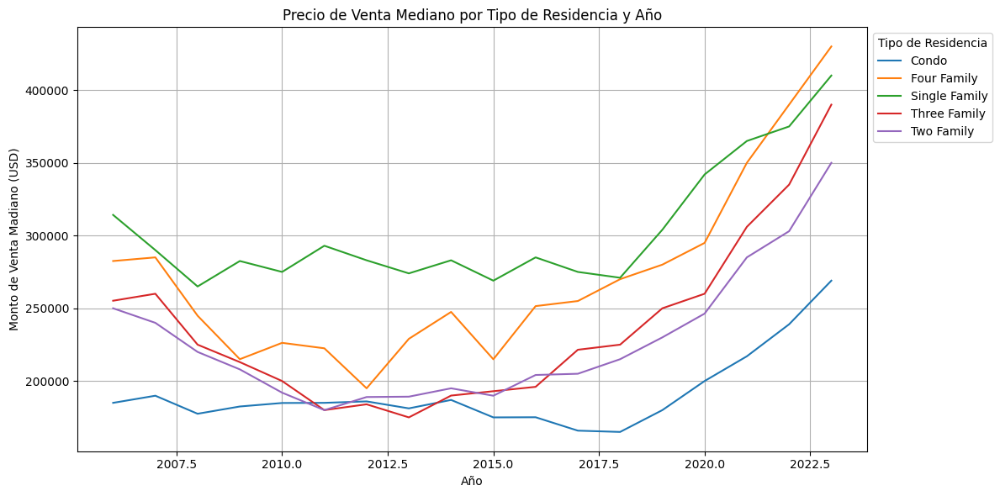

In [ ]:
import matplotlib.pyplot as plt

#Precio mediano de enta por año y por tipo de residencia
precio_medio_tipo_residencial = (
    df.groupby(['List Year', 'Residential Type'])['Sale Amount']
    .median()
    .reset_index()
    .sort_values(by=['List Year', 'Residential Type'])
)

#Creamos matriz de datos
tabla_pivot = precio_medio_tipo_residencial.pivot(
    index='List Year',
    columns='Residential Type',
    values='Sale Amount'
)

#Definimows plot y sus propiedades para poder mostrar grafo
tabla_pivot.plot(figsize=(12,6))

plt.title('Precio de Venta Mediano por Tipo de Residencia y Año')
plt.xlabel('Año')
plt.ylabel('Monto de Venta Madiano (USD)')
plt.legend(title='Tipo de Residencia', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

####Por el grafico, facilmente vemos que a partir del 2008 empezó un proceso de corrección de precio debido a la explosion de la burbuja inmobiliaria estadounidense de ese año. Claramente el grafo muestra una tendencia a la baja de los precios a partir del 2008. Sin embargo, se ve claramente que mientrars casi todos los tipos de residencia cayeron y recuperan su valor hacia 2020, las que muestran una caida menos marcada o abrupta son los tipos Single Family y Condo, lo que puede interpretarse como una fortaleza de este tipo de residencia a crisis inmobiliarias severas.